In [1]:
import scanpy as sc
import numpy as np
import scipy.sparse as sp

### Import anndata with layers['normalized']

In [14]:
adata = sc.read_h5ad('/home/workspace/private/working/normalized_adata_030526.h5ad')
adata

AnnData object with n_obs × n_vars = 4374290 × 52
    obs: 'cell_id', 'sample_id', 'Timeframe', 'batch_id', 'x', 'y', 'Outline Area (µm²)', 'Perimeter (µm)', 'Circularity'
    var: 'marker_name'
    layers: 'intensity_mean', 'intensity_median', 'intensity_std', 'normalized'

In [15]:
## move unwanted markers to new object

markers_to_keep = [
    'PanCytokAE1AE3AF488', 'CD207-7430AF647',
    'CD1c-OTI2F4AF750', 'PDPN-LpMab-12AF488',
    'EphB2-D2X2IAF750', 'Periostin-E5F2SAF488',
    'CD209-1781AF750', 'CD90-E3V8AAF488',
    'CD103-3904RAF750', 'SOD2-D3X8FAF488',
    'CD11c-D3V1EAF647', 'YKL-40-E2L1MAF555',
    'CD7-E4G1QAF488', 'CD14-D7A2TAF488',
    'SMA-1A4AF488', 'NAkATPaseEP1845Y555', 'HLADR-LN3AF647',
    'CD452B11PD726AF750', 'CD4EPR6855AF555', 'CD20-E7B7TAF647',
    'CD16-DJ130cAF750', 'CD27-EPR8569AF555', 'CD3d-EP4426AF647',
    'CD8a-c8144BAF750', 'CD68-KP1AF555', 'TCR-delta-E2E9TAF647',
    'CD15-MC480AF750', 'ECadherin-24E10AF488',
    'MUC2-CCP58AF647', 'CD56-NCAM1-795-AF750'
]

# Verify all markers exist in the object
missing = [m for m in markers_to_keep if m not in adata.var['marker_name'].values]
print(f"Missing markers: {missing}")

# Subset
adata_subset = adata[:, adata.var['marker_name'].isin(markers_to_keep)].copy()
print(adata_subset)

Missing markers: []
AnnData object with n_obs × n_vars = 4374290 × 30
    obs: 'cell_id', 'sample_id', 'Timeframe', 'batch_id', 'x', 'y', 'Outline Area (µm²)', 'Perimeter (µm)', 'Circularity'
    var: 'marker_name'
    layers: 'intensity_mean', 'intensity_median', 'intensity_std', 'normalized'


In [16]:
adata = adata_subset

### Move normalized layer to adata.X

In [17]:
# Make adata.X contain the normalized data

# Store current adata.X in a layer called 'raw'
adata.layers['X_mean'] = adata.X.copy()

# Replace adata.X with the normalized layer
adata.X = adata.layers['normalized'].copy()
adata

AnnData object with n_obs × n_vars = 4374290 × 30
    obs: 'cell_id', 'sample_id', 'Timeframe', 'batch_id', 'x', 'y', 'Outline Area (µm²)', 'Perimeter (µm)', 'Circularity'
    var: 'marker_name'
    layers: 'intensity_mean', 'intensity_median', 'intensity_std', 'normalized', 'X_mean'

In [18]:
# Check for problematic values in the normalized layer
layer_data = adata.layers['normalized']
print(f"Min: {np.min(layer_data)}")
print(f"Max: {np.max(layer_data)}")
print(f"Any NaN: {np.any(np.isnan(layer_data))}")

# Check for extreme values
print(f"Number of very large values (>100): {np.sum(layer_data > 20000)}")
print(adata.obs['sample_id'].unique)

Min: 0.0
Max: 240979.87505699697
Any NaN: False
Number of very large values (>100): 7862
<bound method Series.unique of cell_id
962193_MS00000915_R0     MS00000915_R0
962194_MS00000915_R0     MS00000915_R0
962195_MS00000915_R0     MS00000915_R0
962196_MS00000915_R0     MS00000915_R0
962197_MS00000915_R0     MS00000915_R0
                             ...      
1695538_MS00000965_R1    MS00000965_R1
1695539_MS00000965_R1    MS00000965_R1
1695540_MS00000965_R1    MS00000965_R1
1695541_MS00000965_R1    MS00000965_R1
1695542_MS00000965_R1    MS00000965_R1
Name: sample_id, Length: 4374290, dtype: category
Categories (50, object): ['MS00000915_R0', 'MS00000915_R1', 'MS00000917_R0', 'MS00000917_R1', ..., 'MS00000963_R0', 'MS00000963_R1', 'MS00000965_R0', 'MS00000965_R1']>


### Standard clustering

In [ ]:
# standard workflow
sc.pp.neighbors(adata, use_rep='X')
sc.tl.umap(adata)
sc.tl.leiden(adata, n_iterations=2, resolution = 0.1)

adata

/home/workspace/environment/scanpyv2/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/workspace/environment/scanpyv2/lib/python3.11/site-packages/umap/spectral.py:342: UserWarning: Exited at iteration 20 with accuracies 
[0.01682174 0.01692524 0.01687088]
not reaching the requested tolerance 1e-08.
Use iteration 21 instead with accuracy 
0.016872617551763596.

  eigenvalues, eigenvectors = scipy.sparse.linalg.lobpcg(
/home/workspace/environment/scanpyv2/lib/python3.11/site-packages/umap/spectral.py:342: UserWarning: Exited postprocessing with accuracies 
[0.01682174 0.01692524 0.01687087]
not reaching the requested tolerance 1e-08.
  eigenvalues, eigenvectors = scipy.sparse.linalg.lobpcg(
IOStream.flush timed out
IOStream.flush timed out
/tmp/ipykernel_125/792039320.py:4: FutureWarning: In the futu

In [24]:
# Check that results exist

print(f"UMAP computed: {'X_umap' in adata.obsm}")
print(f"Leiden clusters: {'leiden' in adata.obs}")
print(f"Number of clusters: {adata.obs['leiden'].nunique()}")
print(f"Data shape: {adata.shape}")

UMAP computed: True
Leiden clusters: True
Number of clusters: 19
Data shape: (4374290, 30)


In [ ]:
adata.write_h5ad('reducedMarkers_R01clustered_adata_032426.h5ad')

# Plotting/Data Exploration

In [ ]:
adata = sc.read_h5ad('/home/workspace/private/working/notebooks/reducedMarkers_R01clustered_adata_032426.h5ad')
adata

In [25]:
adata.var['marker_name']

PanCytokAE1AE3AF488      PanCytokAE1AE3AF488
CD207-7430AF647              CD207-7430AF647
CD1c-OTI2F4AF750            CD1c-OTI2F4AF750
PDPN-LpMab-12AF488        PDPN-LpMab-12AF488
EphB2-D2X2IAF750            EphB2-D2X2IAF750
Periostin-E5F2SAF488    Periostin-E5F2SAF488
CD209-1781AF750              CD209-1781AF750
CD90-E3V8AAF488              CD90-E3V8AAF488
CD103-3904RAF750            CD103-3904RAF750
SOD2-D3X8FAF488              SOD2-D3X8FAF488
CD11c-D3V1EAF647            CD11c-D3V1EAF647
YKL-40-E2L1MAF555          YKL-40-E2L1MAF555
CD7-E4G1QAF488                CD7-E4G1QAF488
CD14-D7A2TAF488              CD14-D7A2TAF488
SMA-1A4AF488                    SMA-1A4AF488
NAkATPaseEP1845Y555      NAkATPaseEP1845Y555
HLADR-LN3AF647                HLADR-LN3AF647
CD452B11PD726AF750        CD452B11PD726AF750
CD4EPR6855AF555              CD4EPR6855AF555
CD20-E7B7TAF647              CD20-E7B7TAF647
CD16-DJ130cAF750            CD16-DJ130cAF750
CD27-EPR8569AF555          CD27-EPR8569AF555
CD3d-EP442

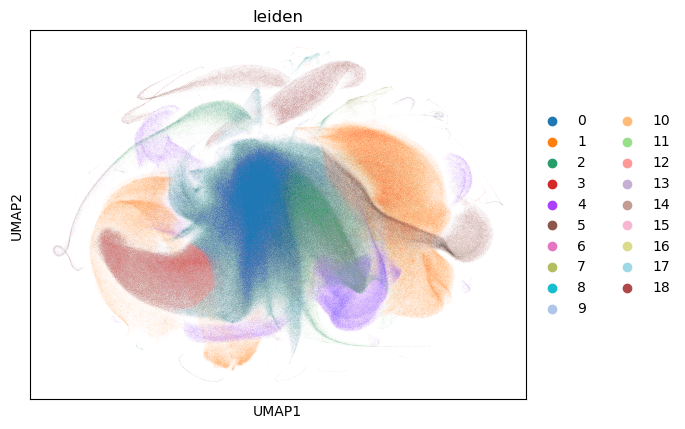

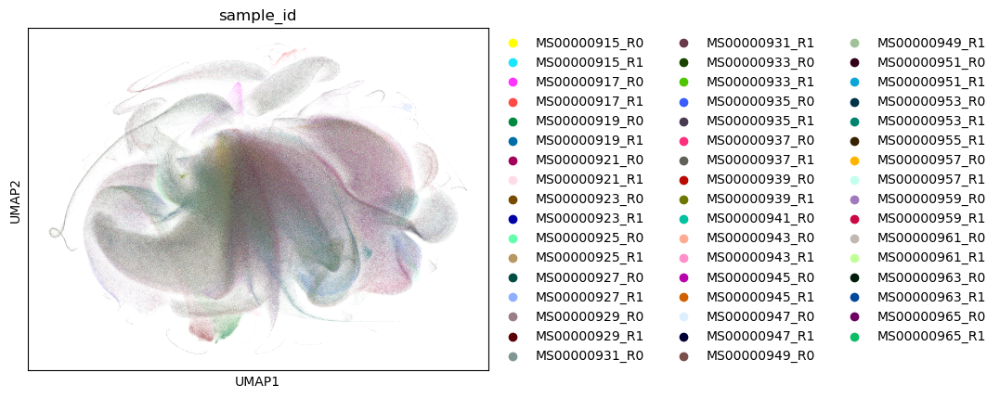

"\n# Plot multiple QC metrics\nsc.pl.umap(adata, color=['leiden', 'sample_id', 'n_genes', 'n_counts'])\n"

In [26]:
# Plot UMAP colored by clusters
sc.pl.umap(adata, color='leiden')

# Plot UMAP colored by batch
sc.pl.umap(adata, color='sample_id')
'''
# Plot multiple QC metrics
sc.pl.umap(adata, color=['leiden', 'sample_id', 'n_genes', 'n_counts'])
'''

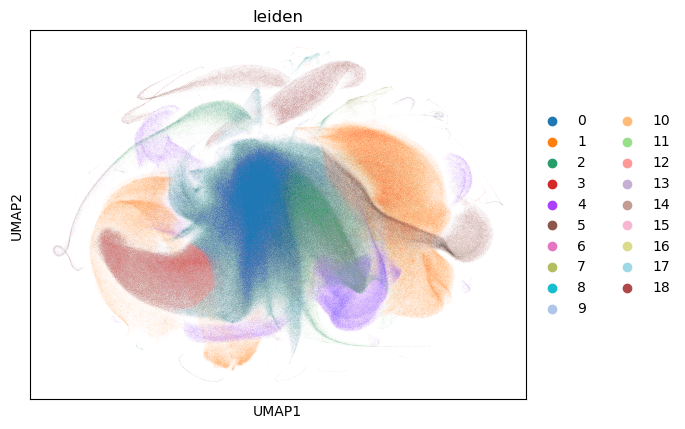

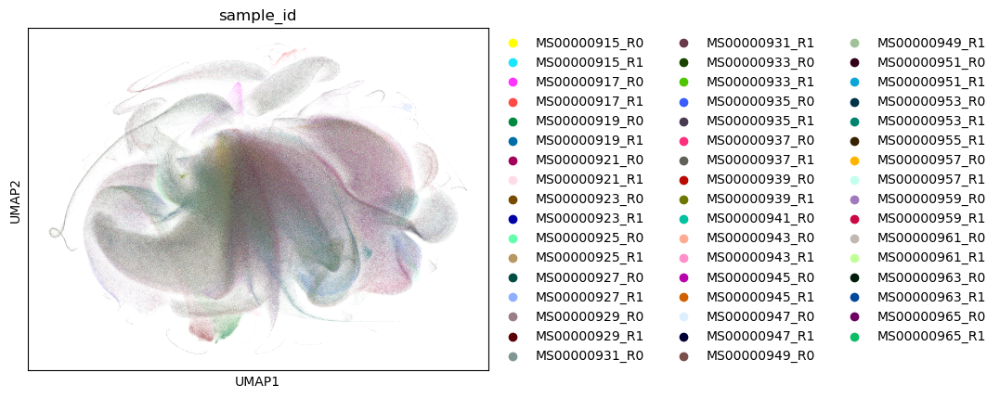

"\n# Plot multiple QC metrics\nsc.pl.umap(adata, color=['leiden', 'sample_id', 'n_genes', 'n_counts'])\n"

In [27]:
# Plot UMAP colored by clusters
sc.pl.umap(adata, color='leiden')

# Plot UMAP colored by batch
sc.pl.umap(adata, color='sample_id')
'''
# Plot multiple QC metrics
sc.pl.umap(adata, color=['leiden', 'sample_id', 'n_genes', 'n_counts'])
'''

In [14]:
# Define key markers for each cell type to assess clustering ability to identify cell populations

DC = ["CD11c-D3V1EAF647", "HLADR-LN3AF647", "CD1c-OTI2F4AF750", ]
Immune = ['CD452B11PD726AF750']
T = ["FoxP3-D2W8EAF647","CD8a-c8144BAF750","CD3d-EP4426AF647","CD4EPR6855AF555", "TCR-delta-E2E9TAF647"]
B = ["CD20-E7B7TAF647"]
Monocyte =['CD16-DJ130cAF750','CD14-D7A2TAF488']
interesting = ["CD103-3904RAF750", "pmTORS2448-49F9AF555", "ClvCasp-3-58A1EAF750"]
Epithelial = ['ECadherin-24E10AF488']

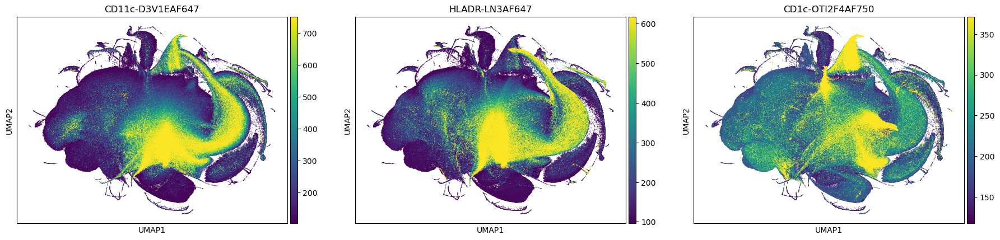

In [15]:
# DCs

sc.pl.umap(
    adata,
    color= DC,
    vmax = "p99",
    vmin = "p10",
    # Setting a smaller point size to get prevent overlap
    size=2,
)

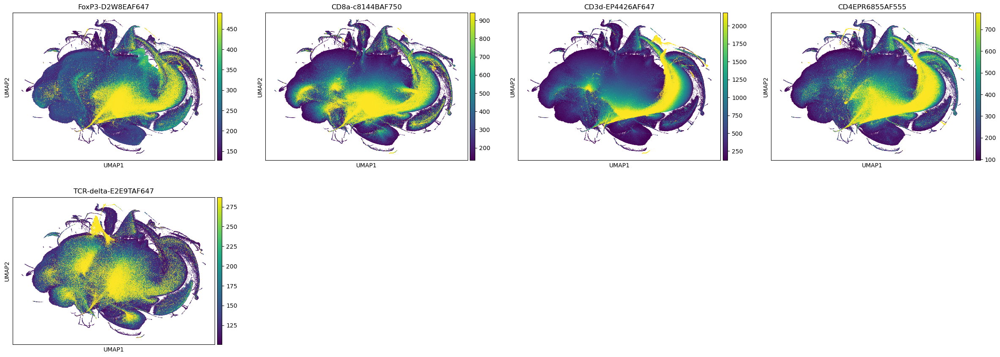

In [16]:
# T Cells

sc.pl.umap(
    adata,
    color= T,
    vmax = "p99",
    vmin = "p10",
    # Setting a smaller point size to get prevent overlap
    size=2,
)

/home/workspace/environment/scanpyv2/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:452: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/workspace/environment/scanpyv2/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:452: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/workspace/environment/scanpyv2/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:452: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/workspace/environment/scanpyv2/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:452: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/workspace/environment/scanpyv2/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:452: RuntimeWarning: overflow encountered in expm1
  foldchange

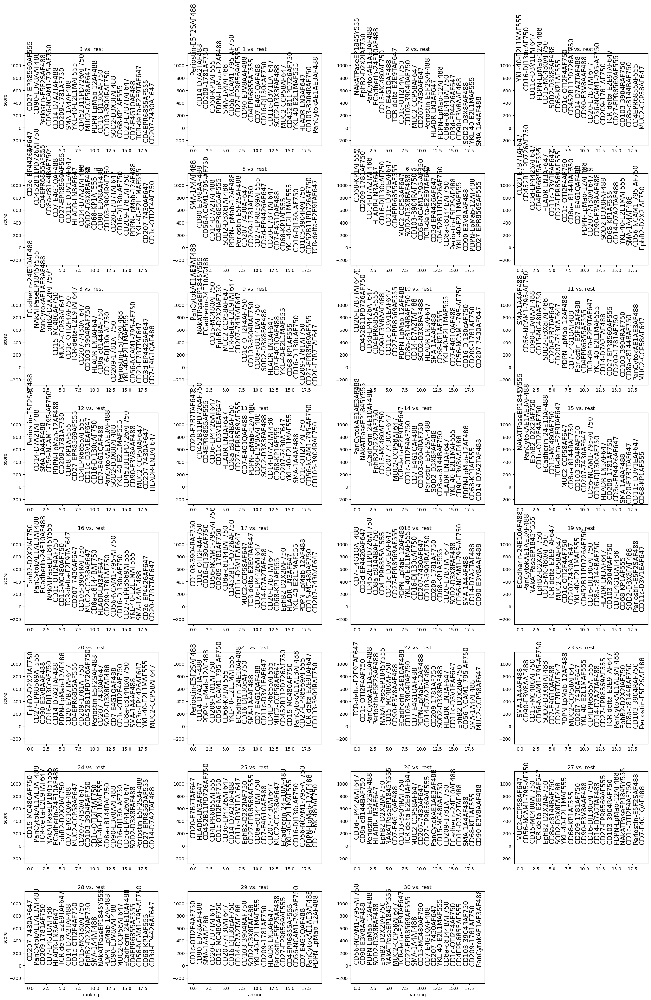

In [5]:
sc.tl.rank_genes_groups(adata, groupby='leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groupby='leiden',fontsize=15)

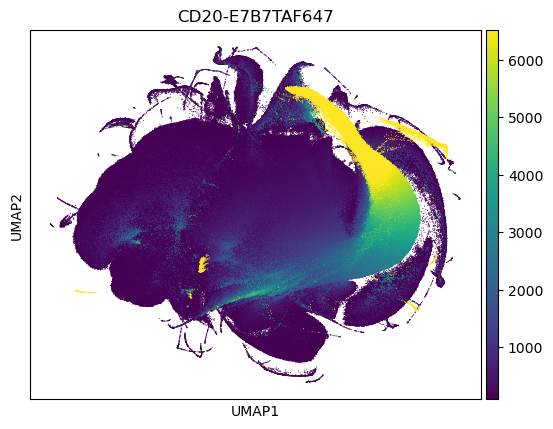

In [17]:
# B Cells

sc.pl.umap(
    adata,
    color= ,
    vmax = "p99",
    vmin = "p10",
    # Setting a smaller point size to get prevent overlap
    size=2,
)

# Spatial organization

In [35]:
adata = sc.read_h5ad('/home/workspace/private/working/notebooks/reducedMarkers_R05clustered_adata_032426.h5ad')
adata

AnnData object with n_obs × n_vars = 4374290 × 30
    obs: 'cell_id', 'sample_id', 'Timeframe', 'batch_id', 'x', 'y', 'Outline Area (µm²)', 'Perimeter (µm)', 'Circularity', 'leiden'
    var: 'marker_name'
    uns: 'leiden', 'neighbors', 'umap'
    obsm: 'X_umap'
    layers: 'X_mean', 'intensity_mean', 'intensity_median', 'intensity_std', 'normalized'
    obsp: 'connectivities', 'distances'

In [36]:
import matplotlib.pyplot as plt
import numpy as np

leiden_labels   = adata.obs['leiden'].astype('category')
unique_clusters = leiden_labels.cat.categories
n_clusters      = len(unique_clusters)

def build_distinct_palette(n):
    sources = [
        plt.cm.tab10(np.linspace(0, 1, 10)),
        plt.cm.Set1(np.linspace(0, 1, 9)),
        plt.cm.Dark2(np.linspace(0, 1, 8)),
        plt.cm.Set2(np.linspace(0, 1, 8)),
        plt.cm.Paired(np.linspace(0, 1, 12)),
    ]
    pool      = [color for src in sources for color in src]
    step      = max(1, len(pool) // max(n, 1))
    reordered = []
    for offset in range(step):
        reordered.extend(pool[offset::step])
    return [reordered[i % len(reordered)] for i in range(n)]

palette = build_distinct_palette(n_clusters)

# Store as hex strings in adata.uns — this is the format scanpy expects
import matplotlib.colors as mcolors
adata.uns['leiden_colors'] = [mcolors.to_hex(c) for c in palette]

# Verify
for cluster, color in zip(unique_clusters, adata.uns['leiden_colors']):
    print(f"Cluster {cluster}: {color}")

Cluster 0: #1f77b4
Cluster 1: #ff7f0e
Cluster 2: #2ca02c
Cluster 3: #d62728
Cluster 4: #9467bd
Cluster 5: #8c564b
Cluster 6: #e377c2
Cluster 7: #7f7f7f
Cluster 8: #bcbd22
Cluster 9: #17becf
Cluster 10: #e41a1c
Cluster 11: #377eb8
Cluster 12: #4daf4a
Cluster 13: #984ea3
Cluster 14: #ff7f00
Cluster 15: #ffff33
Cluster 16: #a65628
Cluster 17: #f781bf
Cluster 18: #999999
Cluster 19: #1b9e77
Cluster 20: #d95f02
Cluster 21: #7570b3
Cluster 22: #e7298a
Cluster 23: #66a61e
Cluster 24: #e6ab02
Cluster 25: #a6761d
Cluster 26: #666666
Cluster 27: #66c2a5
Cluster 28: #fc8d62
Cluster 29: #8da0cb
Cluster 30: #e78ac3


In [7]:
adata.uns['leiden_colors'] = [
    '#e6194b',  # cluster 0
    '#3cb44b',  # cluster 1
    '#4363d8',  # cluster 2
    '#f58231',  # cluster 3
    '#911eb4',  # cluster 4
    '#42d4f4',  # cluster 5
    '#f032e6',  # cluster 6
    '#bfef45',  # cluster 7
    '#fabed4',  # cluster 8
    '#469990',  # cluster 9
    '#dcbeff',  # cluster 10
    '#9A6324',  # cluster 11
    '#fffac8',  # cluster 12
    '#800000',  # cluster 13
    '#aaffc3',  # cluster 14
    '#000075',  # cluster 15
]

### Single marker distribution across all samples
edit configuration to choose marker

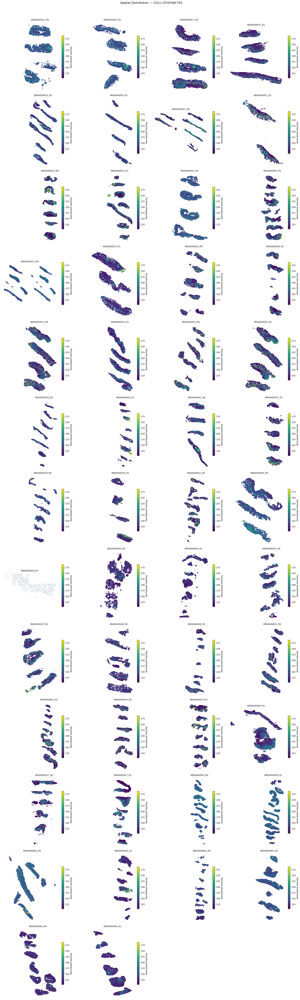

In [32]:
import matplotlib.pyplot as plt
import numpy as np
import math

# --- Configuration ---
MARKER = "CD1c-OTI2F4AF750"
CMAP = "viridis"
POINT_SIZE = 0.5  # small point size for dense data
COLS = 4

# --- Setup ---
sample_ids = adata.obs['sample_id'].unique()
n_samples = len(sample_ids)
n_cols = min(COLS, n_samples)
n_rows = math.ceil(n_samples / n_cols)

# Get normalized intensity for the chosen marker
marker_idx = list(adata.var['marker_name']).index(MARKER)
layer = adata.layers['normalized']

# Handle sparse or dense matrix
if hasattr(layer, 'toarray'):
    intensity = np.asarray(layer[:, marker_idx].toarray()).flatten()
else:
    intensity = np.asarray(layer[:, marker_idx]).flatten()

# Clip to 2nd–98th percentile to handle outliers
vmin, vmax = np.percentile(intensity, [2, 98])

# --- Plot ---
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
axes = axes.flatten()

for i, sample in enumerate(sample_ids):
    ax = axes[i]
    mask = (adata.obs['sample_id'] == sample).values
    x = adata.obs.loc[mask, 'x'].values
    y = adata.obs.loc[mask, 'y'].values
    c = intensity[mask]

    sc_plot = ax.scatter(x, y, c=c, cmap=CMAP, s=POINT_SIZE,
                         vmin=vmin, vmax=vmax, rasterized=True)
    ax.set_title(sample, fontsize=10)
    ax.set_aspect('equal')
    ax.axis('off')
    plt.colorbar(sc_plot, ax=ax, shrink=0.6, label='Normalized Intensity')

# Hide unused axes
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.suptitle(f"Spatial Distribution — {MARKER}", fontsize=14, y=1.01)
plt.tight_layout()
plt.savefig("spatial_intensity_CD1c.pdf", dpi=150, bbox_inches='tight')
plt.show()

### Cluster breakdown for a single sample

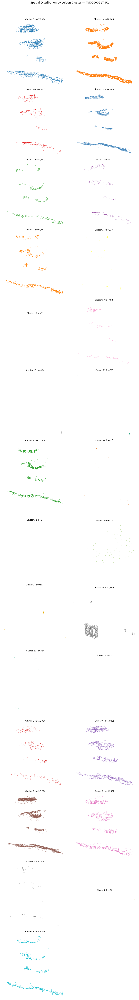

In [40]:
import matplotlib.pyplot as plt
import numpy as np
import math

# --- Configuration ---
POINT_SIZE = 0.1
SAMPLE = "MS00000917_R1"
COLS = 2

# --- Filter to sample ---
sample_mask = (adata.obs['sample_id'] == SAMPLE).values
adata_sample = adata[sample_mask, :]

# Get leiden cluster labels for this sample
leiden_labels = adata_sample.obs['leiden'].astype('category')
unique_clusters = sorted(leiden_labels.cat.categories.tolist())
n_clusters = len(unique_clusters)
n_cols = min(COLS, n_clusters)
n_rows = math.ceil(n_clusters / n_cols)

# Assign colors
if 'leiden_colors' in adata.uns:
    all_clusters = adata.obs['leiden'].astype('category').cat.categories
    colors = adata.uns['leiden_colors']
    cluster_to_color = dict(zip(all_clusters, colors))
else:
    cmap = plt.cm.get_cmap('tab15', n_clusters)
    cluster_to_color = {clust: cmap(i) for i, clust in enumerate(unique_clusters)}

# --- Plot ---
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
axes = axes.flatten()

for i, cluster in enumerate(unique_clusters):
    ax = axes[i]
    cluster_mask = (leiden_labels == cluster).values
    x = adata_sample.obs.loc[cluster_mask, 'x'].values
    y = adata_sample.obs.loc[cluster_mask, 'y'].values

    ax.scatter(x, y, c=cluster_to_color[cluster], s=POINT_SIZE, rasterized=True)
    ax.set_title(f'Cluster {cluster} (n={len(x):,})', fontsize=10)
    ax.set_aspect('equal')
    ax.axis('off')

# Hide unused axes
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.suptitle(f"Spatial Distribution by Leiden Cluster — {SAMPLE}", fontsize=14, y=1.01)
plt.tight_layout()
plt.savefig(f"spatial_leiden_by_cluster_{SAMPLE}.pdf", dpi=150, bbox_inches='tight')
plt.show()

### Spatial cluster distribution

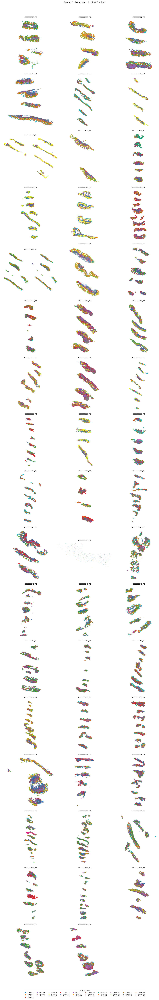

In [37]:
import matplotlib.pyplot as plt
import numpy as np
import math

# --- Configuration ---
POINT_SIZE = 0.05
COLS = 3
adata_filtered = adata

# --- Setup ---

sample_ids = adata_filtered.obs['sample_id'].unique()
n_samples = len(sample_ids)
n_cols = min(COLS, n_samples)
n_rows = math.ceil(n_samples / n_cols)
adata_filtered = adata

# Get leiden cluster labels and assign colors
leiden_labels = adata_filtered.obs['leiden'].astype('category')
unique_clusters = leiden_labels.cat.categories
n_clusters = len(unique_clusters)

# Use scanpy's default leiden colors if available, otherwise generate
if 'leiden_colors' in adata_filtered.uns:
    colors = adata_filtered.uns['leiden_colors']
    cluster_to_color = dict(zip(unique_clusters, colors))
else:
    cmap = plt.cm.get_cmap('tab10', n_clusters)
    cluster_to_color = {clust: cmap(i) for i, clust in enumerate(unique_clusters)}

# --- Plot ---
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
axes = axes.flatten()

for i, sample in enumerate(sample_ids):
    ax = axes[i]
    mask = (adata_filtered.obs['sample_id'] == sample).values
    x = adata_filtered.obs.loc[mask, 'x'].values
    y = adata_filtered.obs.loc[mask, 'y'].values
    clusters = leiden_labels[mask]
    point_colors = [cluster_to_color[c] for c in clusters]

    ax.scatter(x, y, c=point_colors, s=POINT_SIZE, rasterized=True)
    ax.set_title(sample, fontsize=10)
    ax.set_aspect('equal')
    ax.axis('off')

# Hide unused axes
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

# --- Shared legend ---
legend_handles = [
    plt.Line2D([0], [0], marker='o', color='w',
               markerfacecolor=cluster_to_color[c], markersize=6, label=f'Cluster {c}')
    for c in unique_clusters
]
fig.legend(handles=legend_handles, title='Leiden Cluster',
           loc='lower center', ncol=min(n_clusters, 10),
           bbox_to_anchor=(0.5, -0.02), fontsize=8)

plt.suptitle("Spatial Distribution — Leiden Clusters", fontsize=14, y=1.01)
plt.tight_layout()
plt.savefig("spatial_leiden_clusters.pdf", dpi=150, bbox_inches='tight')
plt.show()

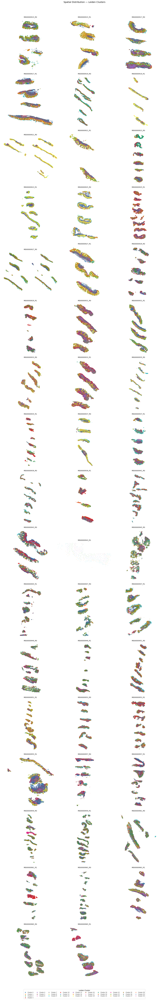

In [12]:
import matplotlib.pyplot as plt
import numpy as np
import math

# --- Configuration ---
POINT_SIZE = 0.1
COLS = 3
adata_filtered = adata

# --- Setup ---

sample_ids = adata_filtered.obs['sample_id'].unique()
n_samples = len(sample_ids)
n_cols = min(COLS, n_samples)
n_rows = math.ceil(n_samples / n_cols)
adata_filtered = adata

# Get leiden cluster labels and assign colors
leiden_labels = adata_filtered.obs['leiden'].astype('category')
unique_clusters = leiden_labels.cat.categories
n_clusters = len(unique_clusters)

# Use scanpy's default leiden colors if available, otherwise generate
if 'leiden_colors' in adata_filtered.uns:
    colors = adata_filtered.uns['leiden_colors']
    cluster_to_color = dict(zip(unique_clusters, colors))
else:
    cmap = plt.cm.get_cmap('tab10', n_clusters)
    cluster_to_color = {clust: cmap(i) for i, clust in enumerate(unique_clusters)}

# --- Plot ---
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
axes = axes.flatten()

for i, sample in enumerate(sample_ids):
    ax = axes[i]
    mask = (adata_filtered.obs['sample_id'] == sample).values
    x = adata_filtered.obs.loc[mask, 'x'].values
    y = adata_filtered.obs.loc[mask, 'y'].values
    clusters = leiden_labels[mask]
    point_colors = [cluster_to_color[c] for c in clusters]

    ax.scatter(x, y, c=point_colors, s=POINT_SIZE, rasterized=True)
    ax.set_title(sample, fontsize=10)
    ax.set_aspect('equal')
    ax.axis('off')

# Hide unused axes
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

# --- Shared legend ---
legend_handles = [
    plt.Line2D([0], [0], marker='o', color='w',
               markerfacecolor=cluster_to_color[c], markersize=6, label=f'Cluster {c}')
    for c in unique_clusters
]
fig.legend(handles=legend_handles, title='Leiden Cluster',
           loc='lower center', ncol=min(n_clusters, 10),
           bbox_to_anchor=(0.5, -0.02), fontsize=8)

plt.suptitle("Spatial Distribution — Leiden Clusters", fontsize=14, y=1.01)
plt.tight_layout()
plt.savefig("spatial_leiden_clusters.pdf", dpi=150, bbox_inches='tight')
plt.show()